In [2]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.layers import Layer, Dense, Flatten, Activation, Dropout, LeakyReLU
from tensorflow.keras.regularizers import l2
from tensorflow.keras import Model
from sklearn.model_selection import train_test_split
#from numba import vectorize, cuda, float32
from scipy.sparse import csr_matrix
from _datetime import datetime
from PIL import Image
import matplotlib.pyplot as plt
import pickle
import os

#from spektral_graph.object_detection.Fetch_Prop_graph import Fetch_graph

from spektral.layers import GATConv, GlobalAttentionPool
from spektral.layers.pooling import TopKPool

import numpy as np
import random

import numpy as np
import pickle


# import sys  
# sys.path.insert(0, '/home/sachin/PycharmProjects/spektral_graph')

from utility.Fetch_Prop_graph import Fetch_graph
from utility.binaryProcessing import nclass_to_binclass

Layer 0: M_0 = |V| = 16384 nodes (0 added), |E| = 33023 edges


In [17]:
# Load data
# Load the cell region proposal data as a graph features, labels
with open("./tmp/dataset/300_aug_DATA_train_label_Parameter_ver11_NotOnlyDELTA_New.pkl", "rb") as fp:
    DATA = pickle.load(fp)

# with open("./tmp/dataset/44and45_DATA_train_label_Parameter_ver11_NotOnlyDELTA_New.pkl", "rb") as fp:
#     DATA_44_45 = pickle.load(fp)

# DATA = [np.concatenate([DATA[0], DATA_44_45[0]]), np.concatenate([DATA[1], DATA_44_45[1]]), np.concatenate([DATA[2], DATA_44_45[2]])]  

In [18]:
len(DATA[0])

120951

In [ ]:
DATA = [DATA[0][-70000:], DATA[1][-70000:], DATA[2][-70000:]]    
A_train, A_test, x_train, x_test, y_train, y_test = nclass_to_binclass(DATA)
#A_train, A_val, x_train, x_val, y_train, y_val = train_test_split(A_train, x_train, y_train, test_size=0.1)

number of unique elements LABELS : (array([0, 1, 2]), array([50400,  2788, 16812]))
shape (2, 3)


In [5]:
print(np.unique(y_train, return_counts=True))

(array([0, 1, 2]), array([2484,  165,  951]))


In [6]:
# One_hot labels for the binary classification
y_train = tf.one_hot(y_train, 3).numpy()
y_test = tf.one_hot(y_test, 3).numpy()

In [7]:
len(x_train)

3600

In [8]:
# Train model   
############# functional model
with tf.device('/GPU:0'):
    class BasicGraphNet(tf.keras.Model):
        # @tf.function
        def __init__(self):
            super(BasicGraphNet, self).__init__()

            self.G1 = GATConv(32, activation='relu', kernel_regularizer=reg)

            self.G2 = GATConv(32, activation='relu', kernel_regularizer=reg)
            #self.G1 = GraphAttention(32, activation='relu')
            #self.G2 = GraphAttention(32, activation='relu')
            #self.G1 = GraphAttention(32)
            #self.G2 = GraphAttention(32)
            
            self.B1 = tf.keras.layers.BatchNormalization(trainable=True)
            self.A1 = tf.keras.layers.Activation('relu')
            self.pool_1 = GlobalAttentionPool(64)
            self.pool_2 = GlobalAttentionPool(n_classes)
            self.A2 = tf.keras.layers.Activation('softmax')


            self.TopKpool = TopKPool(ratio=0.5)

            # self.F1 = tf.keras.layers.Flatten(name='flatten')
            self.O1 = tf.keras.layers.Dense(64, kernel_regularizer=reg, name='dense_100')
            self.D1 = tf.keras.layers.Dropout(0.2, name='dropout')
            #self.O2 = tf.keras.layers.Dense(n_classes, activation='softmax', kernel_regularizer=reg, name='dense_2')
            self.O2 = tf.keras.layers.Dense(n_classes, activation='softmax', name='dense_2')

        # @tf.function
        def call(self, input_tensor, training=True):

            x = self.G1([input_tensor[0], input_tensor[1]])
            #x = self.G2([x, input_tensor[1]])
            #x = self.B1(x)
            #x = self.A1(x)

            x = self.pool_1(x)
            #x, A = self.TopKpool(x, input_tensor[1])
                        
            #x = self.O1(x)
            #x = self.D1(x, training)
            #x = self.O2(x)
            x = self.pool_2(x)
            x = self.A2(x)

            return x

        # @tf.function
        def _compute_gradients(self, tape, tensor, var_list):
            grads = tape.gradient(tensor, var_list)
            # print(type(grads))
            # print(type(var_list))
            return [grad if grad is not None else tf.zeros_like(var) for var, grad in zip(var_list, grads)]

        #@tf.function
        def train_step(self, A_train, x_train, y_train):
            '''
                This is a TensorFlow function, run once for each epoch for the
                whole input. We move forward first, then calculate gradients
                with Gradient Tape to move backwards.
            '''
            for i in range(len(x_train)):
                # determine starting and ending slice indexes for the current
                # batch
                start = i * 1
                end = start + 1
                # take a step
                A = A_train[start:end][0]
                X = x_train[start:end][0]
                y = y_train[start:end]

                with tf.GradientTape(watch_accessed_variables=True) as tape:
                    # make a prediction using the model and then calculate the
                    # loss
                    # extract graph from y and make a list with x
                    # tape.watch(self.trainable_variables)
                    # grp = tf.convert_to_tensor(grp)
                    X = (X / 255).astype(np.float32)
                    y_pred = model([X, A], training=True)
                    #print("y_pred:",y_pred)
                    y_true = y[0]
                    #y_true = tf.one_hot(y_true, depth=2)
                    #print("y_true:",y_true)
                    loss = loss_object(y_true, y_pred[0])
                    # print("loss",loss)
                variables = self.trainable_variables
                # calculate the gradients using our tape and then update the
                # model weights

                # tmp_var = tf.constant((self.trainable_variables[0]).numpy())
                # grads = self._compute_gradients(tape, loss, variables)
                grads = tape.gradient(loss, variables)
                # print(grads)
                opt.apply_gradients(zip(grads, variables))

                #uncomment if not working propoerly
                metricLoss(loss)
                metricsAcc(y_true, y_pred[0])

                # comment if not working properly
                #metricLoss.update_state(loss)
                #metricsAcc.update_state(y_true, y_pred)

                #if (i == 10000 or i == 50000 or i == 90000):
                #    print(i)

            # Loss and accuracy
            train_loss_results.append(metricLoss.result())
            train_accuracy_results.append(metricsAcc.result())


        #@tf.function
        def test_step(self, A_val, x_val, y_val):
            '''
                This is a TensorFlow function, run once for each epoch for the
                whole input.
            '''
            for i in range(len(x_val)):
                # determine starting and ending slice indexes for the current
                # batch
                start = i * 1
                end = start + 1
                # take a step
                A_ = A_val[start:end][0]
                X_ = x_val[start:end][0]
                y_ = y_val[start:end]

                X_ = (X_ / 255).astype(np.float32)
                y_pred_ = model([X_, A_], training=False)

                y_true_ = y_[0]

                t_loss = loss_object(y_true_, y_pred_[0])

                #uncomment if not working propoerly
                test_loss(t_loss)
                test_metric(y_true_, y_pred_[0])

                # comment if not working properly
                #test_loss.update_state(t_loss)
                #test_metric.update_state(y_true_, y_pred_)

                #if (i == 100 or i == 500 or i == 900):
                #    print(i)

            test_loss_results.append(test_loss.result())
            test_accuracy_results.append(test_metric.result())


        # @tf.function
        def fit(self, A_train, A_val, x_train, x_val, y_train, y_val, epochs):
            '''
                This fit function runs training and testing.
            '''
            best_val_loss = np.inf
            best_weights = None
            patience = es_patience
            epoch = 0
            start = datetime.now()
            while True:
                # print("Epoch {}: Start Time {}".format(epoch,start))

                self.train_step(A_train, x_train, y_train)
                self.test_step(A_val, x_val, y_val)
                template = '\t Epoch {}, Train Loss: {:.4f}, Train Accuracy: {:.4f}, Val Loss: {:.4f}, Val Accuracy: {:.4f}'
                print(template.format(epoch + 1,
                                      metricLoss.result(),
                                      metricsAcc.result(), test_loss.result(), test_metric.result()))

                #checkpoint.save(file_prefix=checkpoint_prefix)
                
                with train_writer.as_default():
                    tf.summary.scalar('accuracy', metricsAcc.result(), step=epoch + 1)
                    tf.summary.scalar('loss', metricLoss.result(), step=epoch + 1)
  
                with test_writer.as_default():
                    tf.summary.scalar('accuracy', test_metric.result(), step=epoch + 1)
                    tf.summary.scalar('loss', test_loss.result(), step=epoch + 1)

                # Check if loss improved for early stopping
                if test_loss.result() < best_val_loss:
                    best_val_loss = test_loss.result()
                    patience = es_patience
                    print("New best val_loss {:.4f}".format(test_loss.result()))
                    #best_weights = model.get_weights()
                    #save weights
                    checkpoint.save(file_prefix=checkpoint_prefix)
                else:
                    patience -= 1
                    if patience == 0:
                        print("Early stopping (best val_loss: {})".format(best_val_loss))
                        break                
                
                # Reset the metrics for the next epoch
                metricLoss.reset_states()
                metricsAcc.reset_states()

                test_loss.reset_states()
                test_metric.reset_states()

                #print("End Time : {}".format(datetime.now()))
                epoch = epoch+1
            print("Execution time : {}".format(datetime.now() - start))
#### Main execution ##########
## Use K-fold cross validation
from sklearn.model_selection import KFold

dropout = 0.2
momentum = 0.8

n_classes = 3  # Number of classes
reg = l2(1e-5)  # Regularization rate for l2
learning_rate = 5e-5  # Learning rate for Adam
epochs = 10  # Number of training epochs
batch_size = 1  # Batch size
es_patience = 10
decay_steps = 20000

kf = KFold(n_splits=5)
iteration = 1
for train_index, test_index in kf.split(x_train):
    A_train_k, A_val_k = A_train[train_index], A_train[test_index]
    x_train_k, x_val_k = x_train[train_index], x_train[test_index]
    y_train_k, y_val_k = y_train[train_index], y_train[test_index]

    print("K-Fold: {}...".format(iteration))
    with tf.device('/GPU:0'):
        
        train_loss_results = []
        train_accuracy_results = []

        test_loss_results = []
        test_accuracy_results = []

        # model = create_model()
        model = BasicGraphNet()
        # model = MoNet(d=d, n_gaussian=n_gaussian, n_hidden=32, batch_size=batch_size, trainable=True)

        # Hyperparameters

        # For this implementation, batch_size needs to be a divisor of the number of samples (x_train = 51000 samples)


        ## learningi rate schedular, to change learning rate during training based on the model leanring
        #learning_rate_fn = tf.keras.optimizers.schedules.PolynomialDecay(initial_learning_rate=learning_rate,
        #                      decay_steps=decay_steps,
        #                      end_learning_rate=0.0)

        #boundaries = [9, 19]
        #values = [0.1, 0.01, 0.001]

        #learning_rate_fn = tf.keras.optimizers.schedules.PiecewiseConstantDecay(boundaries, values)
        #opt = tf.keras.optimizers.SGD(learning_rate=learning_rate_fn)

        opt = tf.keras.optimizers.Adam(lr=learning_rate)
        #opt = tf.keras.optimizers.SGD(learning_rate=learning_rate_fn, momentum = momentum)      
        #opt = tf.keras.optimizers.RMSprop(learning_rate=learning_rate_fn, momentum=momentum)

        # Make a loss object
        #loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
        #loss_object = tf.keras.losses.CategoricalCrossentropy()
        loss_object = tfa.losses.SigmoidFocalCrossEntropy()
        # loss_object = tf.keras.losses.sparse_categorical_crossentropy

        metricLoss = tf.keras.metrics.Mean(name='train_loss')
        #metricsAcc = tf.keras.metrics.SparseCategoricalAccuracy()
        metricsAcc = tf.keras.metrics.CategoricalAccuracy()


        # Specify metrics for testing
        test_loss = tf.keras.metrics.Mean(name='test_loss')
        #test_metric = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')
        test_metric = tf.keras.metrics.CategoricalAccuracy()
        

        checkpoint_directory = "./tmp/Saved_model/Test_1_focal_loss_three_class/KFold_"+str(iteration)+"/training_checkpoints"
        checkpoint_prefix = os.path.join(checkpoint_directory, ".ckpt")

        checkpoint = tf.train.Checkpoint(optimizer=opt, model=model)
        checkpoint.restore(tf.train.latest_checkpoint(checkpoint_directory))

        current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
        log_dir = 'logs/' + current_time
        
        train_writer = tf.summary.create_file_writer(os.path.join(log_dir, "train"))
        test_writer = tf.summary.create_file_writer(os.path.join(log_dir, "test"))
        # x_train=tf.convert_to_tensor(x_train)
        # y_train=tf.convert_to_tensor(y_train)
        
        #model.fit(A_train_k, A_val_k, x_train_k, x_val_k, y_train_k, y_val_k, epochs=epochs)
        
        iteration = iteration + 1
        
        print("End K-Fold...")

print("Finish K-Fold Training")

K-Fold: 1...
End K-Fold...
K-Fold: 2...
End K-Fold...
K-Fold: 3...


End K-Fold...
K-Fold: 4...
End K-Fold...
K-Fold: 5...


End K-Fold...
Finish K-Fold Training


In [9]:
####### choose best model for the inference
with tf.device('/GPU:0'):
        
    for iteration in range(1,2,1):
        New_model = BasicGraphNet()
        New_checkpoint_directory = "./tmp/Saved_model/Test_1_focal_loss_three_class/KFold_"+str(iteration)+"/training_checkpoints"
        New_checkpoint_prefix = os.path.join(checkpoint_directory, ".ckpt")

        New_checkpoint = tf.train.Checkpoint(optimizer=opt, model=New_model)
        New_checkpoint.restore(tf.train.latest_checkpoint(New_checkpoint_directory))


        ################### INFERENCE #######################
        ################### INFERENCE #######################
        y_inf = []
        pred_inf = []

        print("INFERENCE RESULT #########")
        for i in range(len(x_test)):
            # determine starting and ending slice indexes for the current
            # batch
            start = i * 1
            end = start + 1

            # take a step
            A_ = A_test[start:end][0]
            X_ = x_test[start:end][0]
            y_ = y_test[start:end]

            X_ = (X_ / 255).astype(np.float32)
            y_pred_ = New_model([X_, A_], training=False)
            #print(y_pred_)
            y_true_ = y_[0]

            y_inf.append(np.argmax(y_true_))
            pred_inf.append(np.argmax(y_pred_))

        m = tf.keras.metrics.Accuracy()
        m.update_state(y_inf, pred_inf)
        print("Model {} Inferennnce accuracy: {}".format(iteration, m.result().numpy()))

INFERENCE RESULT #########
Model 1 Inferennnce accuracy: 0.9375


In [ ]:
## Training Acc 0.9755,    Validation Acc 0.9666
## Training loss 0.01916    Validation loss 0.02679
## Model 1 Inferennnce accuracy: 0.96620774269104
#########  stored model ./tmp/Final/Test_1_focal_loss_three_class/KFold_1/training_checkpoints

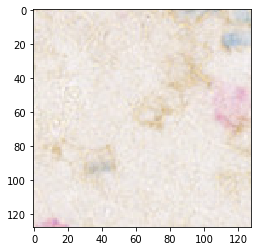

RED delta [15756, 7156]
BLUE delta [2167, 251, 347]


In [15]:
## Load image data for the inference testing and object detection
with open("./tmp/dataset/pathes_47.pkl","rb") as fp:
    DATA = pickle.load(fp)

import matplotlib.pyplot as plt

IMAGE = DATA[0]
signal = np.reshape(np.array(IMAGE, dtype=float), [-1, 128 * 128, 3])
MASK = DATA[2]
DELTA = DATA[3]
CLASS = DATA[4]

im_num = 42
image = IMAGE[im_num]
mask = MASK[im_num]
cls = CLASS[im_num]
delta = DELTA[im_num]

plt.imshow(image)
#plt.imshow(mask)
plt.show()

print("RED delta", delta[0])
print("BLUE delta", delta[1])

In [16]:
######## code for the inference ###################
##### do inference ####
IMAGE_SHAPE = [128, 128]
# with open("/home/sachin/PycharmProjects/MoNet_DATA/MoNet_pkl_files/test_data_128*128.pkl", "rb") as fp:
#     test_data_128 = pickle.load(fp)
pred_sig = np.reshape(image.astype(np.float32), [-1, IMAGE_SHAPE[0] * IMAGE_SHAPE[1], 3])
pred_sig = pred_sig.astype(np.float32)

# pred_sig = np.reshape(np.asarray(Image.open("/home/sachin/PycharmProjects/Cell_Graph_MASK-rcnn/Image_364.png"),dtype=float),[-1,3])

# this dictionary list is the image size 128 x 128
with open("./tmp/dataset/128_20hop_DATA_train_label_Parameter_Nhop_list_128_128.pkl","rb") as fp:
    Nhop_list_dict = pickle.load(fp)

## function to find the adjacency binary matrix of the graph

def adj_mat(gr):
    Adjacency = []
    source = gr[0]
    dest = gr[1]

    dest_new = np.copy(dest)

    # replace source nodes with unique nodes starting from 0
    src_unq_idx_cnt = np.unique(source, return_index=True, return_inverse=True, return_counts=True)
    g = [a for a in range(len(src_unq_idx_cnt[0]))]
    g_idx = src_unq_idx_cnt[2]
    g1 = np.array(g)[g_idx.astype(int)]

    dst_unq_idx_cnt = np.unique(dest, return_index=True, return_inverse=True, return_counts=True)
    dst_unq = dst_unq_idx_cnt[0]
    for du in dst_unq:
        idx = np.where(dest == du)

        idx_s = np.where(source == du)
        real_s = g1[idx_s[0]]

        # put actual value to the destination
        dest_new[idx[0]] = real_s

    new_gr = [g1, dest_new]
    new_gr = np.array(new_gr)

    # create a binary adjaceny matrix using csr_matrix
    N = len(src_unq_idx_cnt[0])  # num of nodes
    value = np.ones(len(new_gr[0]))

    Adj = csr_matrix((value, (new_gr[0], new_gr[1])), shape=(N, N), dtype=np.float32).toarray()

    Adjacency = np.array(Adj)

    return Adjacency


start = datetime.now()
print("Start Time", start)
with tf.device('/GPU:0'):
    Object_pred_1 = []
    Object_pred_2 = []

    Non_object = []
    Threshold_blue = 0.50
    for delta in range(IMAGE_SHAPE[0] * IMAGE_SHAPE[1]):
        Anc_mask_bbox = Nhop_list_dict[delta]
        # remove nhops for faster processing: keep, nhop no. 7, 11, 17
        #Anc_mask_bbox = [Anc_mask_bbox[9],Anc_mask_bbox[13], Anc_mask_bbox[14], Anc_mask_bbox[15]]
        #Anc_mask_bbox = [Anc_mask_bbox[7],Anc_mask_bbox[10], Anc_mask_bbox[12], Anc_mask_bbox[14]]
        #Anc_mask_bbox = [Anc_mask_bbox[8],Anc_mask_bbox[10]]
        #Anc_mask_bbox = [Anc_mask_bbox[8]]

        for Anc_mb in Anc_mask_bbox.items():
            Anc_mask = Anc_mb[1]['Anc_mask_Nhop'][1]  # [int(ik for ik in value[0][0]]
            Anc_bbox = Anc_mb[1]['Anc_bbox_Nhop'][1]
            # print("Anc_mask",Anc_mask)
            Anch_graph = Fetch_graph(Anc_mask)

            ############## anchor from the signal
            X_pred = (pred_sig[0][Anc_mask])/255.0

            A_pred = adj_mat(Anch_graph)

            pred = New_model([X_pred, A_pred], training=False)
            #pred = model([X_pred, A_pred])
            #print("pred",pred)
            #print("pred[0]",pred[0])

            pred_index = np.argmax(pred[0], axis=0)
            # print("pred_idx",pred_index)

            match_score = pred[0][pred_index]
            # print("match_score",match_score)
            if (match_score > Threshold_blue) and (pred_index == 1):
                bbox = [delta, Anc_mb[1]['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
                Object_pred_1.append(bbox)
                
            elif (match_score > Threshold_blue) and (pred_index == 2):
                bbox = [delta, Anc_mb[1]['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
                Object_pred_2.append(bbox)
        #             else:
        #                 bbox = [delta, Anc_mb['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
        #                 Non_object.append(bbox)

        if (delta % 1000) == 0:
            print("delta:", delta)
object_pred = [Object_pred_1, Object_pred_2]
print("End Time : {}".format(datetime.now()))
print("Execution time : {}".format(datetime.now() - start))

Start Time 2021-03-04 17:45:37.162353
delta: 0


KeyboardInterrupt: 

In [12]:
############### below are the results for 9th model Test_2_focal_loss_three_class_model_2.pkl
with open('./tmp/bbox/img42_model_1_bbox.pkl', 'wb') as f:
    pickle.dump(object_pred, f)
#len(object_pred[0])
#with open("./tmp/bbox/img44_model_2_bbox.pkl","rb") as fp:
#    object_pred = pickle.load(fp)

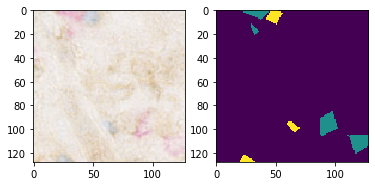

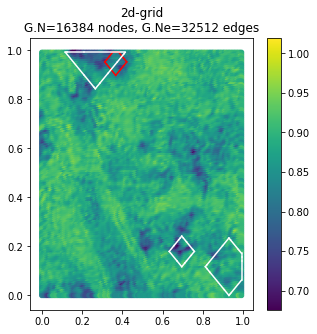

Finish Segmentation
Finish


In [13]:
######################################
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs
import itertools

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)

plt.subplot(121),plt.imshow(sign)
plt.subplot(122),plt.imshow(DATA[1][42])

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[5, 5])
G1.plot_signal(img_gray, ax=plt.gca())

# code for the Non-Maximum suppression
red_bbox = []
blue_bbox = []
for j in range(0,2):
    D = object_pred[j]
    data_arr = np.array(object_pred[j])
    L = [list(v) for k,v in itertools.groupby(data_arr, lambda x: x[0])]

    B = []
    for i in range(len(L)):
        B.append(L[i][-1])
    B = np.array(B)

    def iou_score(a, b):
        a = set(a)
        b = set(b)
        intersection = a.intersection(b)
        union = a.union(b)
        iou_score_ = len(intersection)/len(union)
        return iou_score_

    D = []
    Threshold = 0.01
    while len(B)!= 0:
        #index of the max score
        m = np.argmax([v.numpy() for v in B[:,-1]])
        # find actual bbox
        M = B[m]
        D.append(M)
        B = np.delete(B, m, axis=0)

        for obj in range((len(B)-1), -1, -1):
            if iou_score(M[2], B[obj][2]) >= Threshold:
                B = np.delete(B, obj, axis=0)


    ###### Code plotting the bbox ont he graph 
    for i in range(0, len(D)):
        bbox = D[i][2]
        #print(bbox)
        # best_bbox = bbox[-1:]

        # seg_mask = np.reshape(pred_seg.numpy(),[-1])
        # seg_mask_node_blue = np.where(seg_mask == 1)
        # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

        # seg_mask_node_red = np.where(seg_mask == 2)
        # seg_mask_coord_red = G1.coords[seg_mask_node_red]

        b_coord = np.array(bbox)
        poly_coord = G1.coords[b_coord]
        hull = ConvexHull(poly_coord, qhull_options='QJ')

        #ax = plt.figure(figsize=[5, 5])
        #G1.plot_signal(img_gray, ax=plt.gca())

        if j==0:
            red_bbox.append(bbox)
            for simplex in hull.simplices:
                plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
        elif j==1:
            blue_bbox.append(bbox)
            for simplex in hull.simplices:
                plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'w-')

        # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
        # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
        #plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [43]:
len(red_bbox[0])

760

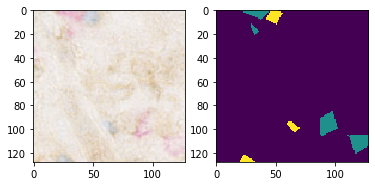

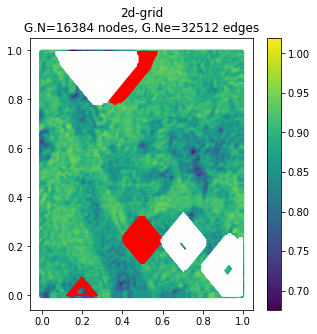

Finish Segmentation
Finish


In [39]:
######################################
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)

plt.subplot(121),plt.imshow(sign)
plt.subplot(122),plt.imshow(display_label[1][40])

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[5, 5])
G1.plot_signal(img_gray, ax=plt.gca())

# code for the Non-Maximum suppression

for j in range(0,2):
    D = object_pred[j]
#     data_arr = np.array(object_pred[j])
#     L = [list(v) for k,v in itertools.groupby(data_arr, lambda x: x[0])]

#     B = []
#     for i in range(len(L)):
#         B.append(L[i][-1])
#     B = np.array(B)

#     def iou_score(a, b):
#         a = set(a)
#         b = set(b)
#         intersection = a.intersection(b)
#         union = a.union(b)
#         iou_score_ = len(intersection)/len(union)
#         return iou_score_

#     D = []
#     Threshold = 0.01
#     while len(B)!= 0:
#         #index of the max score
#         m = np.argmax([v.numpy() for v in B[:,-1]])
#         # find actual bbox
#         M = B[m]
#         D.append(M)
#         B = np.delete(B, m, axis=0)

#         for obj in range((len(B)-1), -1, -1):
#             if iou_score(M[2], B[obj][2]) >= Threshold:
#                 B = np.delete(B, obj, axis=0)


    ###### Code plotting the bbox ont he graph 
    for i in range(0, len(D)):
        bbox = D[i][2]
        #print(bbox)
        # best_bbox = bbox[-1:]

        # seg_mask = np.reshape(pred_seg.numpy(),[-1])
        # seg_mask_node_blue = np.where(seg_mask == 1)
        # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

        # seg_mask_node_red = np.where(seg_mask == 2)
        # seg_mask_coord_red = G1.coords[seg_mask_node_red]

        b_coord = np.array(bbox)
        poly_coord = G1.coords[b_coord]
        hull = ConvexHull(poly_coord, qhull_options='QJ')

        #ax = plt.figure(figsize=[5, 5])
        #G1.plot_signal(img_gray, ax=plt.gca())

        if j==0:
            for simplex in hull.simplices:
                plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
        elif j==1:
            for simplex in hull.simplices:
                plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'w-')

        # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
        # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
        #plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [ ]:
############### below are the results for 9th model Test_2_focal_loss_three_class_model_9.pkl

In [53]:
with open('Test_2_focal_loss_three_class_model_9.pkl', 'wb') as f:
    pickle.dump(object_pred, f)
len(object_pred[1])

36

In [ ]:
######################################
#### Non maximum seperation
import itertools
data_arr = np.array(object_pred[1])
L = [list(v) for k,v in itertools.groupby(data_arr, lambda x: x[0])]

B = []
for i in range(len(L)):
    B.append(L[i][-1])
B = np.array(B)

def iou_score(a, b):
    a = set(a)
    b = set(b)
    intersection = a.intersection(b)
    union = a.union(b)
    iou_score_ = len(intersection)/len(union)
    return iou_score_

D = []
Threshold = 0.01
while len(B)!= 0:
    #index of the max score
    m = np.argmax([v.numpy() for v in B[:,-1]])
    # find actual bbox
    M = B[m]
    D.append(M)
    B = np.delete(B, m, axis=0)

    for obj in range((len(B)-1), -1, -1):
        if iou_score(M[2], B[obj][2]) >= Threshold:
            B = np.delete(B, obj, axis=0)
print("finish")

In [55]:
D=object_pred[1]

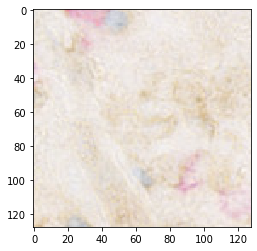

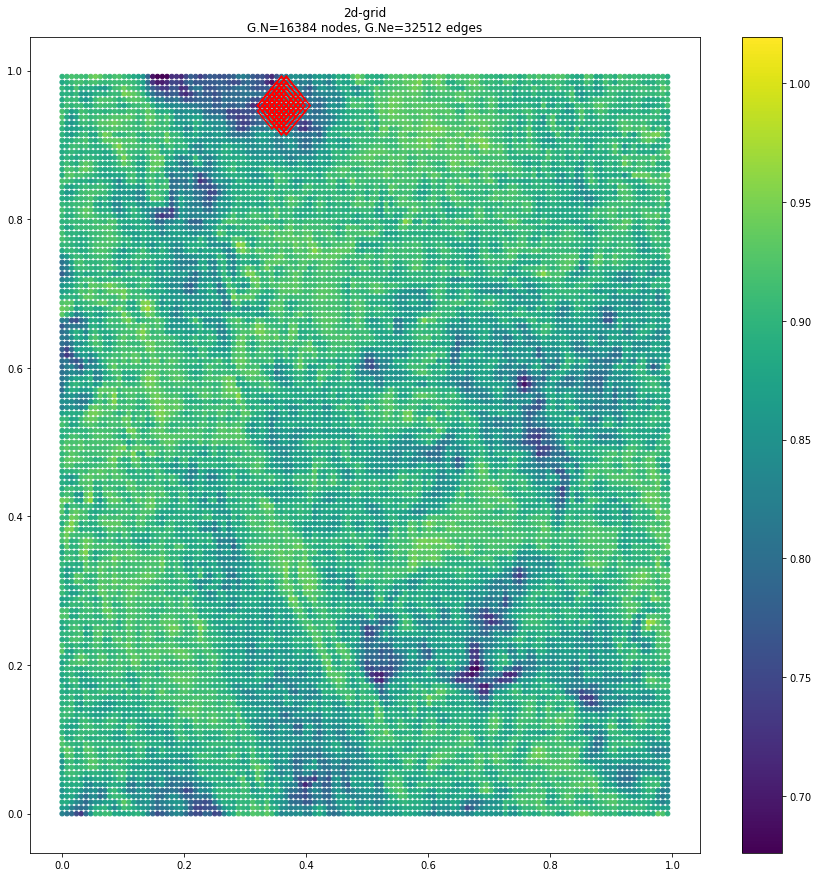

Finish Segmentation
Finish


In [56]:
######################################
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[15, 15])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(D)):
    bbox = D[i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    for simplex in hull.simplices:
        plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    #plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [ ]:
############### below are the results for 10th model Test_2_focal_loss_three_class_model_10.pkl ################

In [47]:
with open('Test_2_focal_loss_three_class_model_10.pkl', 'wb') as f:
    pickle.dump(object_pred, f)
len(object_pred[0])

6140

In [36]:
len(object_pred[0])

6140

In [43]:

######################################
#### Non maximum seperation
import itertools
data_arr = np.array(object_pred[0])
L = [list(v) for k,v in itertools.groupby(data_arr, lambda x: x[0])]

B = []
for i in range(len(L)):
    B.append(L[i][-1])
B = np.array(B)

def iou_score(a, b):
    a = set(a)
    b = set(b)
    intersection = a.intersection(b)
    union = a.union(b)
    iou_score_ = len(intersection)/len(union)
    return iou_score_

D = []
Threshold = 0.01
while len(B)!= 0:
    #index of the max score
    m = np.argmax([v.numpy() for v in B[:,-1]])
    # find actual bbox
    M = B[m]
    D.append(M)
    B = np.delete(B, m, axis=0)

    for obj in range((len(B)-1), -1, -1):
        if iou_score(M[2], B[obj][2]) >= Threshold:
            B = np.delete(B, obj, axis=0)
print("finish")

######################################


finish


In [44]:
#D=object_pred[0]
len(D)

10

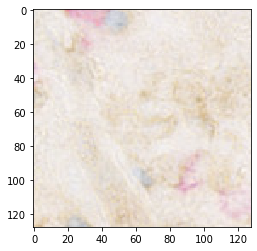

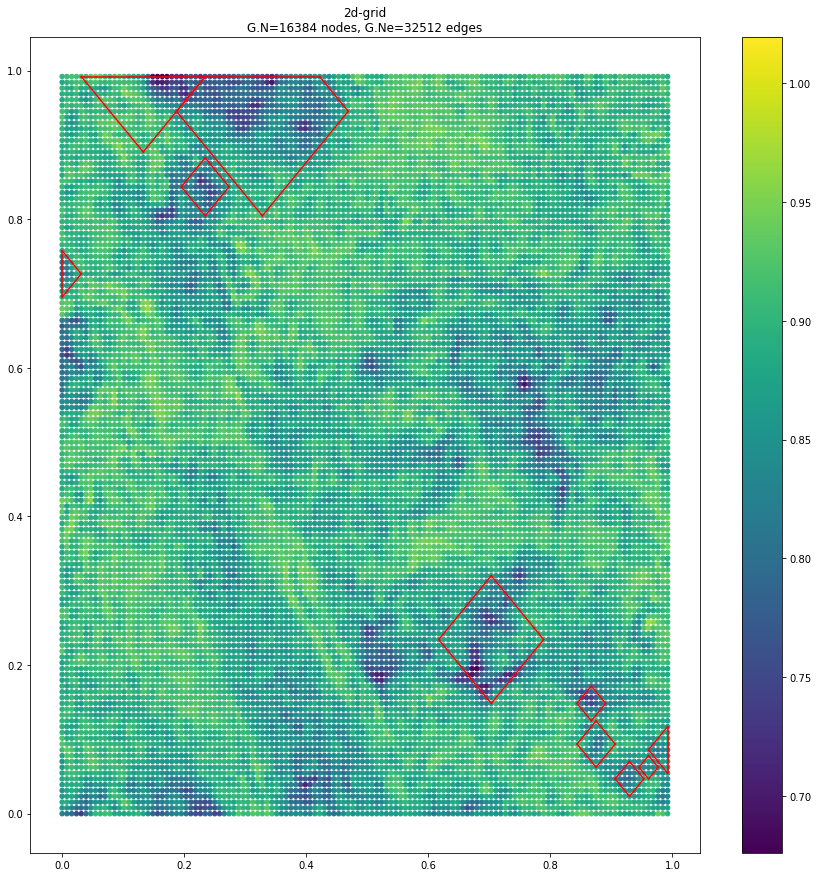

Finish Segmentation
Finish


In [45]:
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[15, 15])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(D)):
    bbox = D[i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    for simplex in hull.simplices:
        plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    #plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [6]:
# fl = tfa.losses.SigmoidFocalCrossEntropy()
# loss = fl(
#   y_true = [[0.28075033, 0.71924967, 0.21924967 ]],
#   y_pred = [[1., 0., 1]])
# print('Loss: ', loss.numpy())  # Loss: [6.8532745e-06,1.9097870e-04, 2.0559824e-05]
# #tmp_model = tf.keras.Model(inputs, outputs)
# #tmp_model.compile('sgd', loss=tfa.losses.SigmoidFocalCrossEntropy())

Loss:  [10.391646]


In [75]:
####### choose best model for the inference
with tf.device('/GPU:0'):
        
    for iteration in range(1,2,1):
        New_model = BasicGraphNet()
        New_checkpoint_directory = "./tmp/Test_2_focal_loss/KFold_"+str(iteration)+"/training_checkpoints"
        New_checkpoint_prefix = os.path.join(checkpoint_directory, ".ckpt")

        New_checkpoint = tf.train.Checkpoint(optimizer=opt, model=New_model)
        New_checkpoint.restore(tf.train.latest_checkpoint(New_checkpoint_directory))


        ################### INFERENCE #######################
        ################### INFERENCE #######################
        y_inf = []
        pred_inf = []

        print("INFERENCE RESULT #########")
        for i in range(len(x_test)):
            # determine starting and ending slice indexes for the current
            # batch
            start = i * 1
            end = start + 1

            # take a step
            A_ = A_test[start:end][0]
            X_ = x_test[start:end][0]
            y_ = y_test[start:end]

            X_ = (X_ / 255).astype(np.float32)
            y_pred_ = New_model([X_, A_], training=False)
            #print(y_pred_)
            y_true_ = y_[0]

            y_inf.append(np.argmax(y_true_))
            pred_inf.append(np.argmax(y_pred_))

        m = tf.keras.metrics.Accuracy()
        m.update_state(y_inf, pred_inf)
        print("Model {} Inferennnce accuracy: {}".format(iteration, m.result().numpy()))

INFERENCE RESULT #########
Model 1 Inferennnce accuracy: 0.8711340427398682


In [6]:
################### INFERENCE #######################
print("INFERENCE RESULT #########")
for i in range(len(x_test)):
    # determine starting and ending slice indexes for the current
    # batch
    start = i * 1
    end = start + 1

    # take a step
    A_ = A_test[start:end][0]
    X_ = x_test[start:end][0]
    y_ = y_test[start:end]

    X_ = (X_ / 255).astype(np.float32)
    y_pred_ = New_model([X_, A_], training=False)
    y_true_ = y_[0]

    print("Pred value : {} and Tru value : {}".format(np.argmax(y_pred_), y_true_))

INFERENCE RESULT #########
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 1 and Tru value : 1
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 1 and Tru value : 1
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 0 and Tru value : 0
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 1 and Tru value : 1
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 0 and Tru value : 1
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 0 and Tru value : 0
Pred value : 1 and Tru value : 0
Pred value : 1 and Tru value : 1
Pred value : 1 and Tru value : 1
Pred value : 1 and Tru value : 1
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 0 and Tru value : 0
Pred value : 1 and Tru value : 1
Pred value : 0 and Tru value : 0
Pred value : 0 a

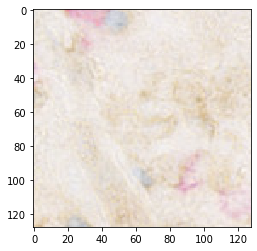

RED delta [14071, 12125, 1951, 161]
BLUE delta [15896, 12351, 560]


In [76]:
## Load image data for the inference testing and object detection
with open("/home/sachin/PycharmProjects/DATASETS/tmp/dataset/DATA/DATA/pathes_47.pkl","rb") as fp:
    DATA = pickle.load(fp)

import matplotlib.pyplot as plt

IMAGE = DATA[0]
signal = np.reshape(np.array(IMAGE, dtype=float), [-1, 128 * 128, 3])
MASK = DATA[2]
DELTA = DATA[3]
CLASS = DATA[4]

im_num = 40
image = IMAGE[im_num]
mask = MASK[im_num]
cls = CLASS[im_num]
delta = DELTA[im_num]

plt.imshow(image)
plt.show()

print("RED delta", delta[0])
print("BLUE delta", delta[1])

In [77]:
######## code for the inference ###################
##### do inference ####
IMAGE_SHAPE = [128, 128]
# with open("/home/sachin/PycharmProjects/MoNet_DATA/MoNet_pkl_files/test_data_128*128.pkl", "rb") as fp:
#     test_data_128 = pickle.load(fp)
pred_sig = np.reshape(image.astype(np.float32), [-1, IMAGE_SHAPE[0] * IMAGE_SHAPE[1], 3])
pred_sig = pred_sig.astype(np.float32)

# pred_sig = np.reshape(np.asarray(Image.open("/home/sachin/PycharmProjects/Cell_Graph_MASK-rcnn/Image_364.png"),dtype=float),[-1,3])

# this dictionary list is the image size 128 x 128
with open("/home/sachin/PycharmProjects/MoNet_class_3d/128_20hop_DATA_train_label_Parameter_Nhop_list_128_128.pkl","rb") as fp:
    Nhop_list_dict = pickle.load(fp)

## function to find the adjacency binary matrix of the graph

def adj_mat(gr):
    Adjacency = []
    source = gr[0]
    dest = gr[1]

    dest_new = np.copy(dest)

    # replace source nodes with unique nodes starting from 0
    src_unq_idx_cnt = np.unique(source, return_index=True, return_inverse=True, return_counts=True)
    g = [a for a in range(len(src_unq_idx_cnt[0]))]
    g_idx = src_unq_idx_cnt[2]
    g1 = np.array(g)[g_idx.astype(int)]

    dst_unq_idx_cnt = np.unique(dest, return_index=True, return_inverse=True, return_counts=True)
    dst_unq = dst_unq_idx_cnt[0]
    for du in dst_unq:
        idx = np.where(dest == du)

        idx_s = np.where(source == du)
        real_s = g1[idx_s[0]]

        # put actual value to the destination
        dest_new[idx[0]] = real_s

    new_gr = [g1, dest_new]
    new_gr = np.array(new_gr)

    # create a binary adjaceny matrix using csr_matrix
    N = len(src_unq_idx_cnt[0])  # num of nodes
    value = np.ones(len(new_gr[0]))

    Adj = csr_matrix((value, (new_gr[0], new_gr[1])), shape=(N, N), dtype=np.float32).toarray()

    Adjacency = np.array(Adj)

    return Adjacency


start = datetime.now()
print("Start Time", start)
with tf.device('/GPU:0'):
    Object_pred_1 = []
    Object_pred_2 = []

    Non_object = []
    Threshold_blue = 0.50
    for delta in range(IMAGE_SHAPE[0] * IMAGE_SHAPE[1]):
        Anc_mask_bbox = Nhop_list_dict[delta]
        # remove nhops for faster processing: keep, nhop no. 7, 11, 17
        #Anc_mask_bbox = [Anc_mask_bbox[9],Anc_mask_bbox[13], Anc_mask_bbox[14], Anc_mask_bbox[15]]
        #Anc_mask_bbox = [Anc_mask_bbox[7],Anc_mask_bbox[10], Anc_mask_bbox[12], Anc_mask_bbox[14]]
        #Anc_mask_bbox = [Anc_mask_bbox[8],Anc_mask_bbox[10]]
        #Anc_mask_bbox = [Anc_mask_bbox[8]]

        for Anc_mb in Anc_mask_bbox.items():
            Anc_mask = Anc_mb[1]['Anc_mask_Nhop'][1]  # [int(ik for ik in value[0][0]]
            Anc_bbox = Anc_mb[1]['Anc_bbox_Nhop'][1]
            # print("Anc_mask",Anc_mask)
            Anch_graph = Fetch_graph(Anc_mask)

            ############## anchor from the signal
            X_pred = pred_sig[0][Anc_mask]
            A_pred = adj_mat(Anch_graph)

            pred = New_model([X_pred, A_pred], training=False)
            #pred = model([X_pred, A_pred])
            #print("pred",pred)
            #print("pred[0]",pred[0])

            pred_index = np.argmax(pred[0], axis=0)
            # print("pred_idx",pred_index)

            match_score = pred[0][pred_index]
            # print("match_score",match_score)
            if (match_score > Threshold_blue) and (pred_index == 1):
                bbox = [delta, Anc_mb[1]['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
                Object_pred_1.append(bbox)
                
#             if (match_score > Threshold_blue) and (pred_index == 2):
#                 bbox = [delta, Anc_mb['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
#                 Object_pred_2.append(bbox)
        #             else:
        #                 bbox = [delta, Anc_mb['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
        #                 Non_object.append(bbox)

        if (delta % 1000) == 0:
            print("delta:", delta)
object_pred = [Object_pred_1, Object_pred_2]
print("End Time : {}".format(datetime.now()))
print("Execution time : {}".format(datetime.now() - start))

Start Time 2020-08-29 15:34:01.674309
delta: 0
delta: 1000
delta: 2000
delta: 3000
delta: 4000
delta: 5000
delta: 6000
delta: 7000
delta: 8000
delta: 9000
delta: 10000
delta: 11000
delta: 12000
delta: 13000
delta: 14000
delta: 15000
delta: 16000
End Time : 2020-08-29 17:12:21.922904
Execution time : 1:38:20.338062


In [82]:
with open('GAT_class_Focal_loss_sample_40_three_CLASS.pkl', 'wb') as f:
    pickle.dump(object_pred, f)
len(object_pred[0])

6661

In [79]:
D = object_pred[0]

In [111]:

######################################
#### Non maximum seperation
import itertools
data_arr = np.array(object_pred[0])
L = [list(v) for k,v in itertools.groupby(data_arr, lambda x: x[0])]

B = []
for i in range(len(L)):
    B.append(L[i][-1])
B = np.array(B)

def iou_score(a, b):
    a = set(a)
    b = set(b)
    intersection = a.intersection(b)
    union = a.union(b)
    iou_score_ = len(intersection)/len(union)
    return iou_score_

D = []
Threshold = 0.15
while len(B)!= 0:
    #index of the max score
    m = np.argmax([v.numpy() for v in B[:,-1]])
    # find actual bbox
    M = B[m]
    D.append(M)
    B = np.delete(B, m, axis=0)

    for obj in range((len(B)-1), -1, -1):
        if iou_score(M[2], B[obj][2]) >= Threshold:
            B = np.delete(B, obj, axis=0)
print("finish")

######################################


finish


In [112]:
len(D)

52

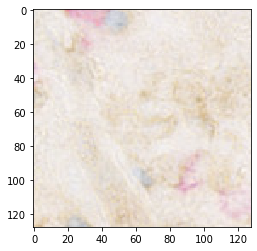

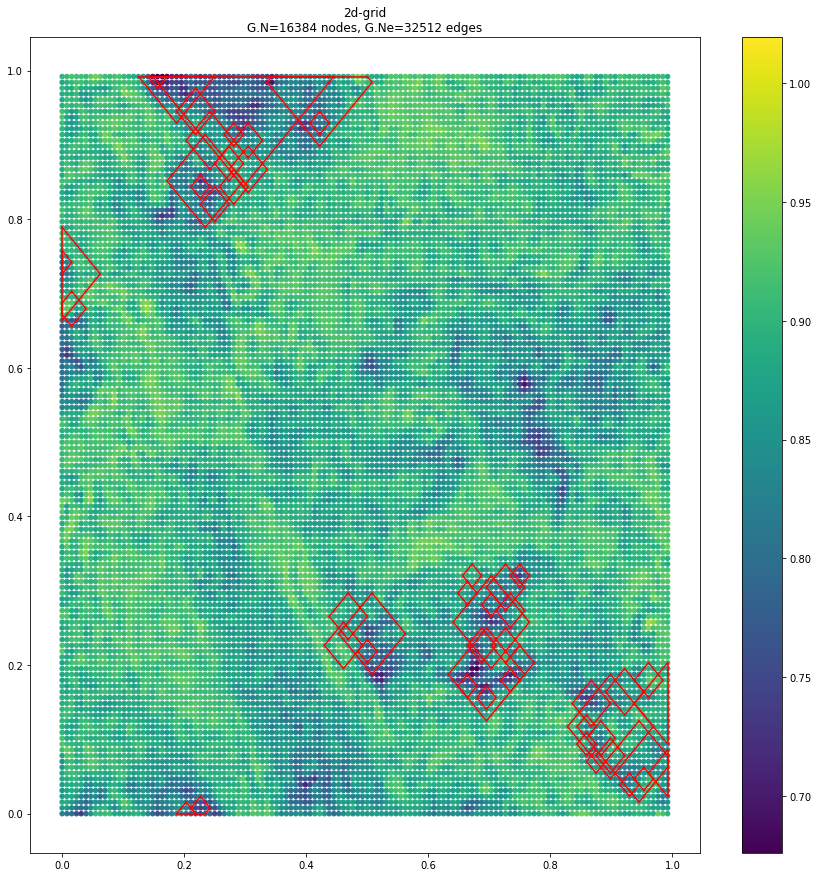

Finish Segmentation
Finish


In [113]:
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[15, 15])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(D)):
    bbox = D[i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    for simplex in hull.simplices:
        plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    #plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

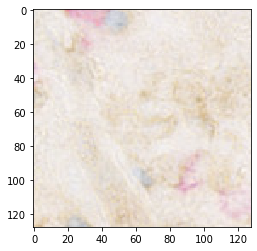

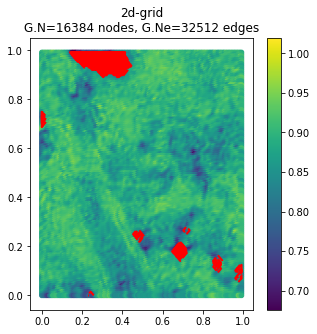

Finish Segmentation
Finish


In [11]:
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[5, 5])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(D)):
    bbox = D[i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    #for simplex in hull.simplices:
    #    plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [ ]:
Object_pred = [Object_pred_1, Object_pred_2]
with open('Spatial-GRcnn-obj_825_sample_40.pkl', 'wb') as f:
    pickle.dump(Object_pred, f)

In [ ]:
################## DO experimentation for Non Maximum Seperation ###############

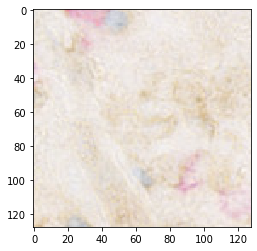

RED delta [14071, 12125, 1951, 161]
BLUE delta [15896, 12351, 560]


In [43]:
## Load image data for the inference testing and object detection
with open("/home/sachin/PycharmProjects/DATASETS/tmp/dataset/DATA/DATA/pathes_47.pkl","rb") as fp:
    DATA = pickle.load(fp)

import matplotlib.pyplot as plt

IMAGE = DATA[0]
signal = np.reshape(np.array(IMAGE, dtype=float), [-1, 128 * 128, 3])
MASK = DATA[2]
DELTA = DATA[3]
CLASS = DATA[4]

im_num = 40
image = IMAGE[im_num]
mask = MASK[im_num]
cls = CLASS[im_num]
delta = DELTA[im_num]

plt.imshow(image)
plt.show()

print("RED delta", delta[0])
print("BLUE delta", delta[1])
    
IMAGE_SHAPE = [128, 128]
# with open("/home/sachin/PycharmProjects/MoNet_DATA/MoNet_pkl_files/test_data_128*128.pkl", "rb") as fp:
#     test_data_128 = pickle.load(fp)
pred_sig = np.reshape(image.astype(np.float32), [-1, IMAGE_SHAPE[0] * IMAGE_SHAPE[1], 3])
pred_sig = pred_sig.astype(np.float32)

In [44]:
##### Load all the region proposals for the above image and do Preprocessing
with open("Spatial-GRcnn-obj_sample_40.pkl", "rb") as fp:
    DATA_bbox = pickle.load(fp)

In [87]:
#red 14071, 12125, 1951, 161
#blue 15896, 12351, 560

In [64]:
## Non-Maximum Seperation
import itertools
data_arr = np.array(DATA_bbox[0])
L = [list(v) for k,v in itertools.groupby(data_arr, lambda x: x[0])]

B = []
for i in range(len(L)):
    B.append(L[i][-1])
B = np.array(B)

def iou_score(a, b):
    a = set(a)
    b = set(b)
    intersection = a.intersection(b)
    union = a.union(b)
    iou_score_ = len(intersection)/len(union)
    return iou_score_

D = []
Threshold = 0.01
while len(B)!= 0:
    #index of the max score
    m = np.argmax([v.numpy() for v in B[:,-1]])
    # find actual bbox
    M = B[m]
    D.append(M)
    B = np.delete(B, m, axis=0)

    for obj in range((len(B)-1), -1, -1):
        #print("obj:",obj)
        if iou_score(M[2], B[obj][2]) >= Threshold:
            B = np.delete(B, obj, axis=0)
len(D)

6

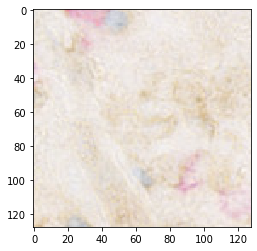

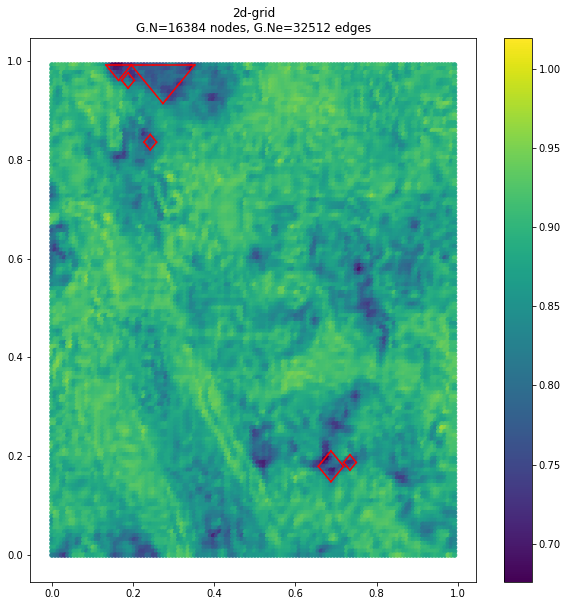

Finish Segmentation
Finish


In [65]:
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[10, 10])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(D)):
    bbox = D[i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    for simplex in hull.simplices:
        plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    #plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

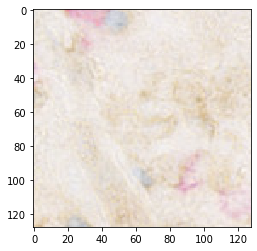

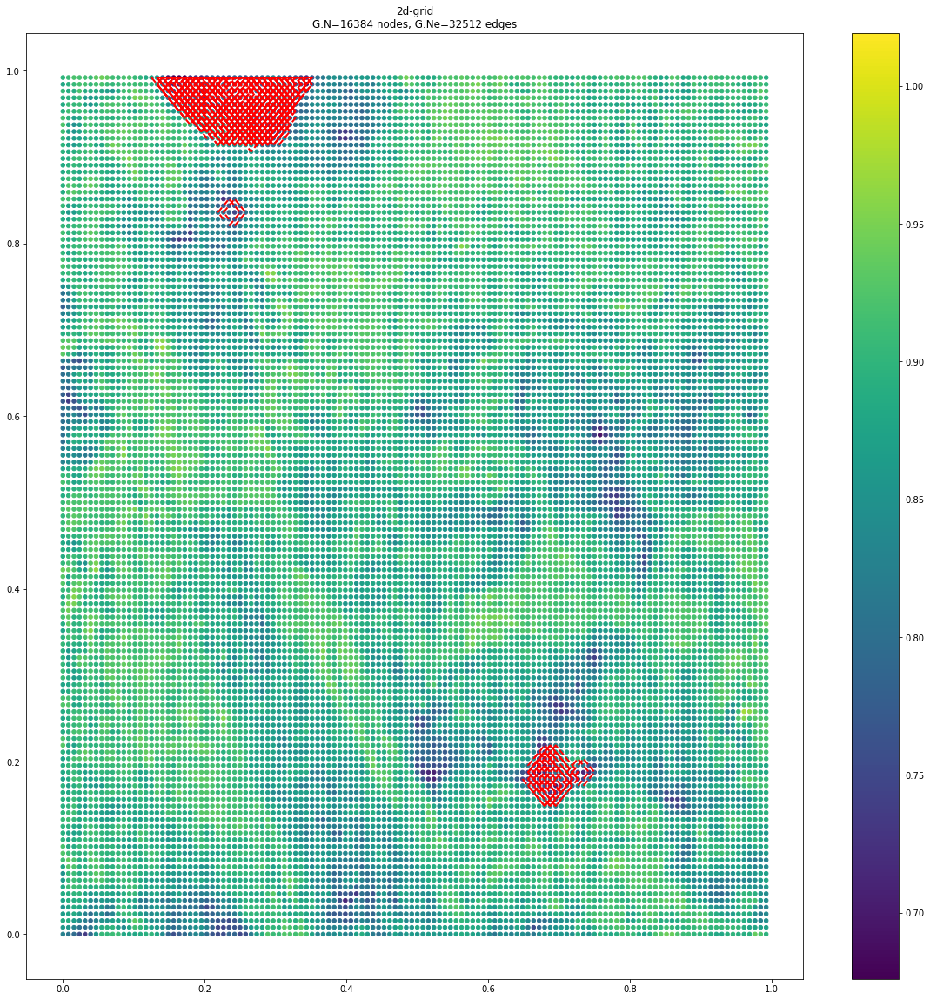

Finish Segmentation
Finish


In [27]:
################## please do experimentation on this #######################
#### Display output of the object detection #####
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[20, 20])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(final_bbox)):
    bbox = final_bbox[i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    #for simplex in hull.simplices:
    #    plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [63]:
len(final_bbox)

133

In [9]:
DATA_bbox[0][0][2]

[20, 148, 19, 21, 147, 149, 276, 18, 22]

In [10]:
DATA_bbox[0][1][2]

[20, 148, 19, 21, 147, 149, 276, 18, 22, 146, 275, 150, 277, 404, 17, 23]

In [11]:
DATA_bbox[0][2][2]

[21, 149, 20, 22, 148, 150, 277, 19, 23]

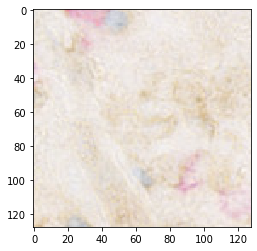

RED delta [14071, 12125, 1951, 161]
BLUE delta [15896, 12351, 560]


In [10]:
## Load image data for the inference testing and object detection
with open("/home/sachin/PycharmProjects/DATASETS/tmp/dataset/DATA/DATA/pathes_47.pkl","rb") as fp:
    DATA = pickle.load(fp)

import matplotlib.pyplot as plt

IMAGE = DATA[0]
signal = np.reshape(np.array(IMAGE, dtype=float), [-1, 128 * 128, 3])
MASK = DATA[2]
DELTA = DATA[3]
CLASS = DATA[4]

im_num = 40
image = IMAGE[im_num]
mask = MASK[im_num]
cls = CLASS[im_num]
delta = DELTA[im_num]

plt.imshow(image)
plt.show()

print("RED delta", delta[0])
print("BLUE delta", delta[1])

######## code for the inference ###################

IMAGE_SHAPE = [128, 128]
# with open("/home/sachin/PycharmProjects/MoNet_DATA/MoNet_pkl_files/test_data_128*128.pkl", "rb") as fp:
#     test_data_128 = pickle.load(fp)
pred_sig = np.reshape(image.astype(np.float32), [-1, IMAGE_SHAPE[0] * IMAGE_SHAPE[1], 3])
pred_sig = pred_sig.astype(np.float32)

K-Fold: 1...
End K-Fold...
K-Fold: 2...
End K-Fold...
K-Fold: 3...


End K-Fold...
K-Fold: 4...


End K-Fold...
K-Fold: 5...
End K-Fold...
Finish K-Fold Training


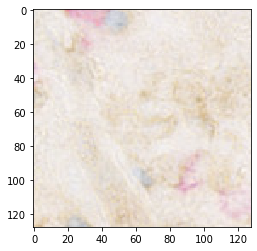

RED delta [14071, 12125, 1951, 161]
BLUE delta [15896, 12351, 560]
Start Time 2020-08-19 09:18:41.884757
delta: 0
delta: 1000
delta: 2000
delta: 3000
delta: 4000
delta: 5000
delta: 6000
delta: 7000
delta: 8000
delta: 9000
delta: 10000
delta: 11000
delta: 12000
delta: 13000
delta: 14000
delta: 15000
delta: 16000
End Time : 2020-08-19 09:25:37.336168
Execution time : 0:06:55.690235


In [11]:
# Train model   
############# functional model
with tf.device('/GPU:0'):
    class BasicGraphNet(tf.keras.Model):
        # @tf.function
        def __init__(self):
            super(BasicGraphNet, self).__init__()

            #self.G1 = GraphAttention(32, activation='relu', kernel_regularizer=l2(l2_reg))

            #self.G2 = GraphAttention(32, activation='relu', kernel_regularizer=l2(l2_reg))
            self.G1 = GraphAttention(32, activation='relu')
            self.G2 = GraphAttention(32, activation='relu')
            
            self.B1 = tf.keras.layers.BatchNormalization(trainable=True)
            self.A1 = tf.keras.layers.Activation('relu')
            self.pool = GlobalAttentionPool(128)

            # self.F1 = tf.keras.layers.Flatten(name='flatten')
            # self.O1 = tf.keras.layers.Dense(13, kernel_regularizer=reg, name='dense_100')
            self.D1 = tf.keras.layers.Dropout(0.5, name='dropout')
            self.O2 = tf.keras.layers.Dense(n_classes, activation='softmax', kernel_regularizer=reg, name='dense_2')
            # self.O2 = tf.keras.layers.Dense(n_classes, kernel_regularizer=reg, name='dense_2')

        # @tf.function
        def call(self, input_tensor, training=True):

            x = self.G1([input_tensor[0], input_tensor[1]])
            x = self.G2([x, input_tensor[1]])
            #x = self.B1(x)
            #x = self.A1(x)

            x = self.pool(x)

            x = self.D1(x, training)
            x = self.O2(x)

            return x

        # @tf.function
        def _compute_gradients(self, tape, tensor, var_list):
            grads = tape.gradient(tensor, var_list)
            # print(type(grads))
            # print(type(var_list))
            return [grad if grad is not None else tf.zeros_like(var) for var, grad in zip(var_list, grads)]

        # @tf.function
        def train_step(self, A_train, x_train, y_train):
            '''
                This is a TensorFlow function, run once for each epoch for the
                whole input. We move forward first, then calculate gradients
                with Gradient Tape to move backwards.
            '''
            for i in range(len(x_train)):
                # determine starting and ending slice indexes for the current
                # batch
                start = i * 1
                end = start + 1
                # take a step
                A = A_train[start:end][0]
                X = x_train[start:end][0]
                y = y_train[start:end]

                with tf.GradientTape(watch_accessed_variables=True) as tape:
                    # make a prediction using the model and then calculate the
                    # loss
                    # extract graph from y and make a list with x
                    # tape.watch(self.trainable_variables)
                    # grp = tf.convert_to_tensor(grp)
                    X = (X / 255).astype(np.float32)
                    y_pred = model([X, A], training=True)
                    # print("y_pred:",y_pred)
                    y_true = y[0]
                    #y_true = tf.one_hot(y_true, depth=2)
                    # print("y_true:",y_true)
                    loss = loss_object(y_true, y_pred)
                    # print("loss",loss)
                variables = self.trainable_variables
                # calculate the gradients using our tape and then update the
                # model weights

                # tmp_var = tf.constant((self.trainable_variables[0]).numpy())
                # grads = self._compute_gradients(tape, loss, variables)
                grads = tape.gradient(loss, variables)
                # print(grads)
                opt.apply_gradients(zip(grads, variables))

                #uncomment if not working propoerly
                metricLoss(loss)
                metricsAcc(y_true, y_pred)

                # comment if not working properly
                #metricLoss.update_state(loss)
                #metricsAcc.update_state(y_true, y_pred)

                #if (i == 10000 or i == 50000 or i == 90000):
                #    print(i)

            # Loss and accuracy
            train_loss_results.append(metricLoss.result())
            train_accuracy_results.append(metricsAcc.result())


        # @tf.function
        def test_step(self, A_val, x_val, y_val):
            '''
                This is a TensorFlow function, run once for each epoch for the
                whole input.
            '''
            for i in range(len(x_val[:1000])):
                # determine starting and ending slice indexes for the current
                # batch
                start = i * 1
                end = start + 1
                # take a step
                A_ = A_val[start:end][0]
                X_ = x_val[start:end][0]
                y_ = y_val[start:end]

                X_ = (X_ / 255).astype(np.float32)
                y_pred_ = model([X_, A_], training=False)

                y_true_ = y_[0]
                #y_true_ = tf.one_hot(y_true_, depth=2)

                # print("y_true:",y_true)
                t_loss = loss_object(y_true_, y_pred_)

                #uncomment if not working propoerly
                test_loss(t_loss)
                test_metric(y_true_, y_pred_)

                # comment if not working properly
                #test_loss.update_state(t_loss)
                #test_metric.update_state(y_true_, y_pred_)

                #if (i == 100 or i == 500 or i == 900):
                #    print(i)

            test_loss_results.append(test_loss.result())
            test_accuracy_results.append(test_metric.result())


        # @tf.function
        def fit(self, A_train, A_val, x_train, x_val, y_train, y_val, epochs):
            '''
                This fit function runs training and testing.
            '''
            for epoch in range(epochs):
                start = datetime.now()
                # print("Epoch {}: Start Time {}".format(epoch,start))

                self.train_step(A_train, x_train, y_train)
                self.test_step(A_val, x_val, y_val)
                template = '\t Epoch {}, Train Loss: {:.4f}, Train Accuracy: {:.4f}, Val Loss: {:.4f}, Val Accuracy: {:.4f}'
                print(template.format(epoch + 1,
                                      metricLoss.result(),
                                      metricsAcc.result() * 100, test_loss.result(), test_metric.result() * 100))

                checkpoint.save(file_prefix=checkpoint_prefix)

                # Reset the metrics for the next epoch
                metricLoss.reset_states()
                metricsAcc.reset_states()

                test_loss.reset_states()
                test_metric.reset_states()

                #print("End Time : {}".format(datetime.now()))
                #print("Execution time : {}".format(datetime.now() - start))

                
#### Main execution ##########
## Use K-fold cross validation
from sklearn.model_selection import KFold

dropout = 0.2
reg = l2(1e-6)
momentum = 0.8

n_classes = 3  # Number of classes
l2_reg = 1e-6  # Regularization rate for l2
learning_rate = 1e-3  # Learning rate for Adam
epochs = 50  # Number of training epochs
batch_size = 1  # Batch size
es_patience = 10
decay_steps = 20000

kf = KFold(n_splits=5)
iteration = 1
for train_index, test_index in kf.split(x_train):
    A_train_k, A_val_k = A_train[train_index], A_train[test_index]
    x_train_k, x_val_k = x_train[train_index], x_train[test_index]
    y_train_k, y_val_k = y_train[train_index], y_train[test_index]

    print("K-Fold: {}...".format(iteration))
    with tf.device('/GPU:0'):
        
        train_loss_results = []
        train_accuracy_results = []

        test_loss_results = []
        test_accuracy_results = []

        # model = create_model()
        model = BasicGraphNet()
        # model = MoNet(d=d, n_gaussian=n_gaussian, n_hidden=32, batch_size=batch_size, trainable=True)

        # Hyperparameters

        # For this implementation, batch_size needs to be a divisor of the number of samples (x_train = 51000 samples)


        ## learningi rate schedular, to change learning rate during training based on the model leanring
        #learning_rate_fn = tf.keras.optimizers.schedules.PolynomialDecay(initial_learning_rate=learning_rate,
        #                      decay_steps=decay_steps,
        #                      end_learning_rate=0.0)

        #boundaries = [9, 19]
        #values = [0.1, 0.01, 0.001]

        #learning_rate_fn = tf.keras.optimizers.schedules.PiecewiseConstantDecay(boundaries, values)
        #opt = tf.keras.optimizers.SGD(learning_rate=learning_rate_fn)

        opt = tf.keras.optimizers.Adam(lr=learning_rate)
        #opt = tf.keras.optimizers.SGD(learning_rate=learning_rate_fn, momentum = momentum)      
        #opt = tf.keras.optimizers.RMSprop(learning_rate=learning_rate_fn, momentum=momentum)

        # Make a loss object
        loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
        #loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
        # loss_object = tf.keras.losses.sparse_categorical_crossentropy

        metricLoss = tf.keras.metrics.Mean(name='train_loss')
        metricsAcc = tf.keras.metrics.SparseCategoricalAccuracy()

        # Specify metrics for testing
        test_loss = tf.keras.metrics.Mean(name='test_loss')
        test_metric = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')

        checkpoint_directory = "./tmp/sample_TMA1_A1/three_class_onlyRightDELTA/KFold_"+str(iteration)+"/training_checkpoints"
        checkpoint_prefix = os.path.join(checkpoint_directory, ".ckpt")

        checkpoint = tf.train.Checkpoint(optimizer=opt, model=model)
        checkpoint.restore(tf.train.latest_checkpoint(checkpoint_directory))

        current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
        train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
        writer = tf.summary.create_file_writer(train_log_dir)

        train_summary_writer = tf.summary.create_file_writer(train_log_dir)

        # x_train=tf.convert_to_tensor(x_train)
        # y_train=tf.convert_to_tensor(y_train)

        #model.fit(A_train_k, A_val_k, x_train_k, x_val_k, y_train_k, y_val_k, epochs=epochs)
        
        iteration = iteration + 1
        
        print("End K-Fold...")

print("Finish K-Fold Training")


## Load image data for the inference testing and object detection
with open("/home/sachin/PycharmProjects/DATASETS/tmp/dataset/DATA/DATA/pathes_47.pkl","rb") as fp:
    DATA = pickle.load(fp)

import matplotlib.pyplot as plt

IMAGE = DATA[0]
signal = np.reshape(np.array(IMAGE, dtype=float), [-1, 128 * 128, 3])
MASK = DATA[2]
DELTA = DATA[3]
CLASS = DATA[4]

im_num = 40
image = IMAGE[im_num]
mask = MASK[im_num]
cls = CLASS[im_num]
delta = DELTA[im_num]

plt.imshow(image)
plt.show()

print("RED delta", delta[0])
print("BLUE delta", delta[1])

IMAGE_SHAPE = [128, 128]
# with open("/home/sachin/PycharmProjects/MoNet_DATA/MoNet_pkl_files/test_data_128*128.pkl", "rb") as fp:
#     test_data_128 = pickle.load(fp)
pred_sig = np.reshape(image.astype(np.float32), [-1, IMAGE_SHAPE[0] * IMAGE_SHAPE[1], 3])
pred_sig = pred_sig.astype(np.float32)

# this dictionary list is the image size 128 x 128
with open("/home/sachin/PycharmProjects/MoNet_class_3d/128_20hop_DATA_train_label_Parameter_Nhop_list_128_128.pkl","rb") as fp:
    Nhop_list_dict = pickle.load(fp)
    

## function to find the adjacency binary matrix of the graph

def adj_mat(gr):
    Adjacency = []
    source = gr[0]
    dest = gr[1]

    dest_new = np.copy(dest)

    # replace source nodes with unique nodes starting from 0
    src_unq_idx_cnt = np.unique(source, return_index=True, return_inverse=True, return_counts=True)
    g = [a for a in range(len(src_unq_idx_cnt[0]))]
    g_idx = src_unq_idx_cnt[2]
    g1 = np.array(g)[g_idx.astype(int)]

    dst_unq_idx_cnt = np.unique(dest, return_index=True, return_inverse=True, return_counts=True)
    dst_unq = dst_unq_idx_cnt[0]
    for du in dst_unq:
        idx = np.where(dest == du)

        idx_s = np.where(source == du)
        real_s = g1[idx_s[0]]

        # put actual value to the destination
        dest_new[idx[0]] = real_s

    new_gr = [g1, dest_new]
    new_gr = np.array(new_gr)

    # create a binary adjaceny matrix using csr_matrix
    N = len(src_unq_idx_cnt[0])  # num of nodes
    value = np.ones(len(new_gr[0]))

    Adj = csr_matrix((value, (new_gr[0], new_gr[1])), shape=(N, N), dtype=np.float32).toarray()

    Adjacency = np.array(Adj)

    return Adjacency
    
start = datetime.now()
print("Start Time", start)
with tf.device('/GPU:0'):
    Object_pred_1 = []
    Object_pred_2 = []

    Non_object = []
    for delta in range(128 * 128):
        Threshold_blue = 0.70
        Threshold_red = 0.70
        Anc_mask_bbox = Nhop_list_dict[delta]
        # remove nhops for faster processing: keep, nhop no. 7, 11, 17
        #Anc_mask_bbox = [Anc_mask_bbox[9],Anc_mask_bbox[13], Anc_mask_bbox[14], Anc_mask_bbox[15]]
        #Anc_mask_bbox = [Anc_mask_bbox[7],Anc_mask_bbox[10], Anc_mask_bbox[12], Anc_mask_bbox[14]]
        #Anc_mask_bbox = [Anc_mask_bbox[3],Anc_mask_bbox[4]]
        Anc_mask_bbox = [Anc_mask_bbox[8]]

        for Anc_mb in Anc_mask_bbox:
            Anc_mask = Anc_mb['Anc_mask_Nhop'][1]  # [int(ik for ik in value[0][0]]
            Anc_bbox = Anc_mb['Anc_bbox_Nhop'][1]
            # print("Anc_mask",Anc_mask)
            Anch_graph = Fetch_graph(Anc_mask)

            ############## anchor from the signal
            X_pred = pred_sig[0][Anc_mask]
            A_pred = adj_mat(Anch_graph)

            pred = model([X_pred, A_pred], training=False)
            #pred = model([X_pred, A_pred])

            pred_index = np.argmax(pred[0], axis=0)
            # print("pred_idx",pred_index)

            match_score = pred[0][pred_index]
            # print("match_score",match_score)
            if (match_score > Threshold_blue) and (pred_index == 1):
                bbox = [delta, Anc_mb['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
                Object_pred_1.append(bbox)
                
            if (match_score > Threshold_blue) and (pred_index == 2):
                bbox = [delta, Anc_mb[1]['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
                Object_pred_2.append(bbox)
        #             else:
        #                 bbox = [delta, Anc_mb['Anc_bbox_Nhop'][0], Anc_mask, Anch_graph, match_score]
        #                 Non_object.append(bbox)

        if (delta % 1000) == 0:
            print("delta:", delta)
            
object = [Object_pred_1, Object_pred_2]
print("End Time : {}".format(datetime.now()))
print("Execution time : {}".format(datetime.now() - start))

In [12]:
len(object[0])

9

NameError: name 'DATA_bbox' is not defined

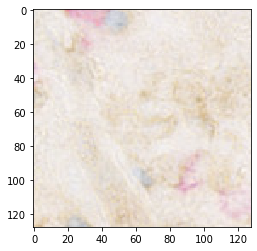

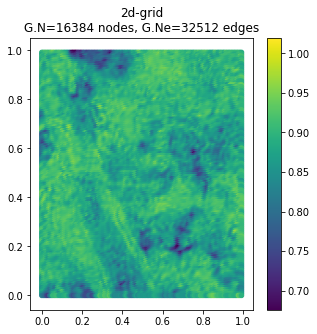

In [14]:
################## please do experimentation on this #######################

# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[5, 5])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(DATA_bbox[0])):
    bbox = DATA_bbox[0][i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    #for simplex in hull.simplices:
    #    plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [11]:
len(object[0])

TypeError: 'type' object is not subscriptable

machin score: 0.9994706511497498
machin score: 1.0
machin score: 1.0
machin score: 1.0
machin score: 0.9999988079071045
machin score: 0.9999997615814209
machin score: 1.0
machin score: 1.0
machin score: 0.7587788105010986


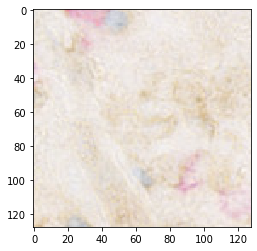

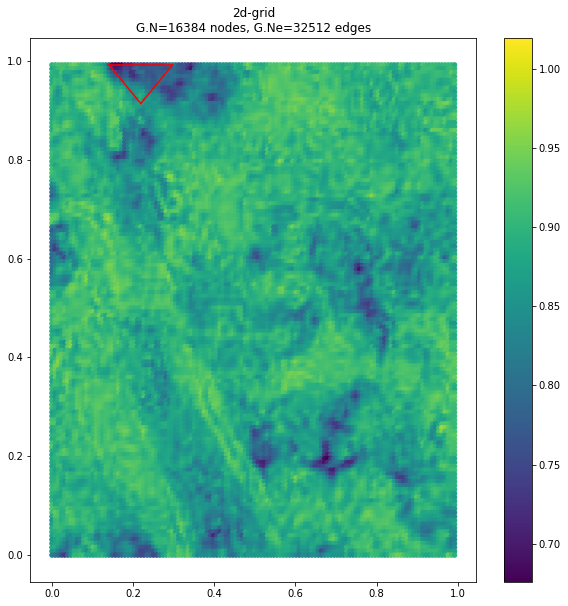

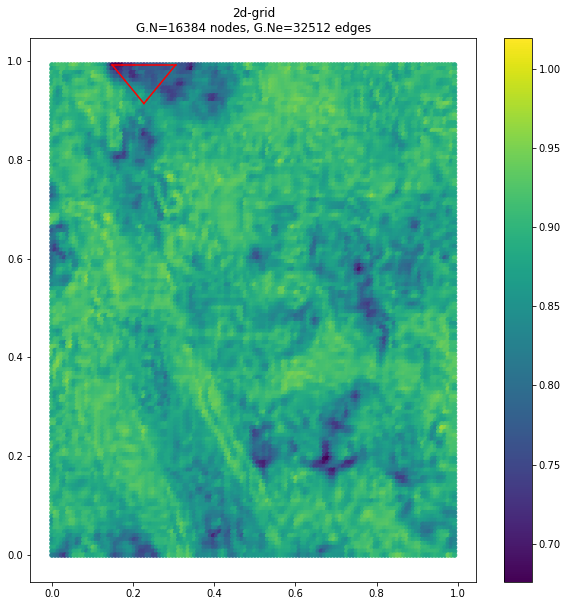

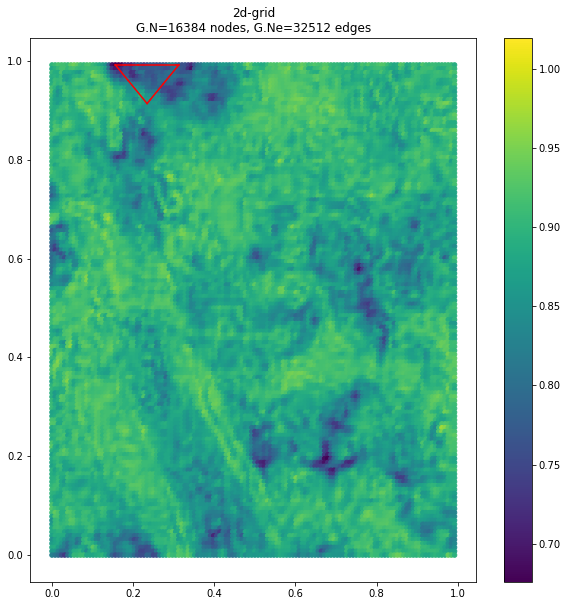

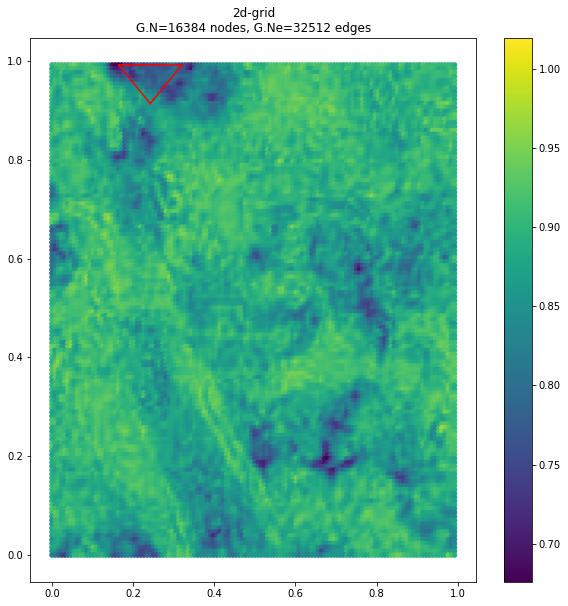

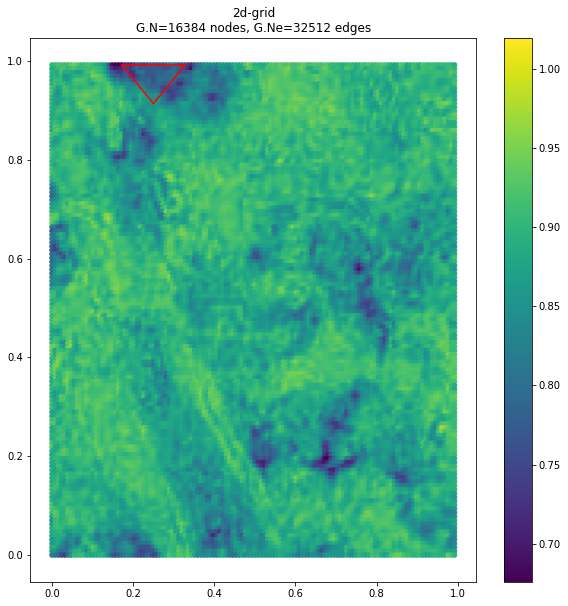

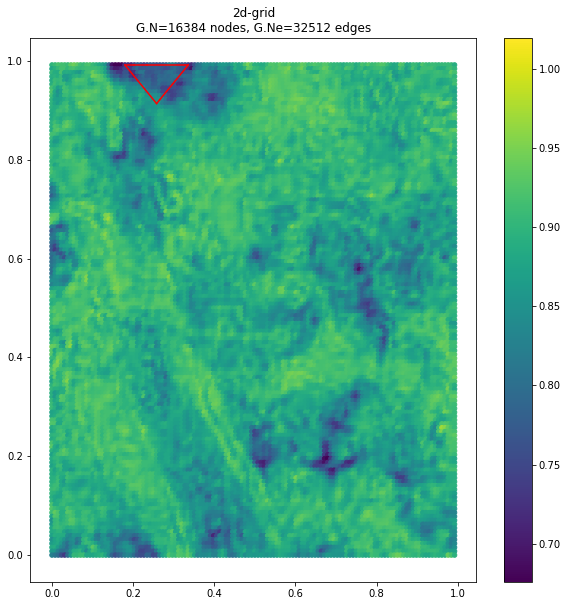

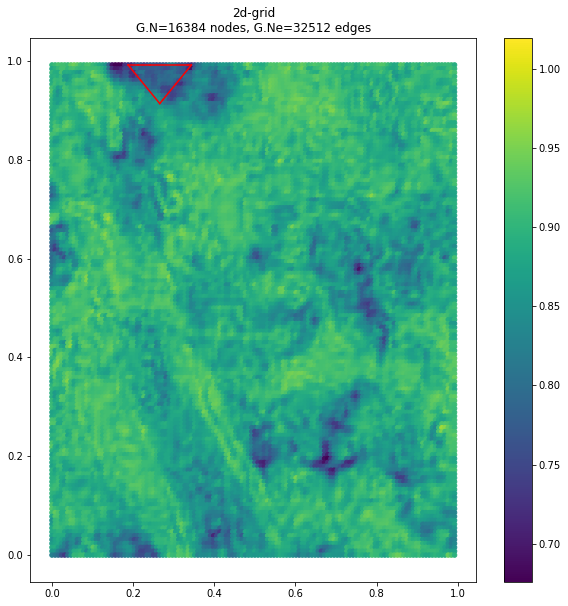

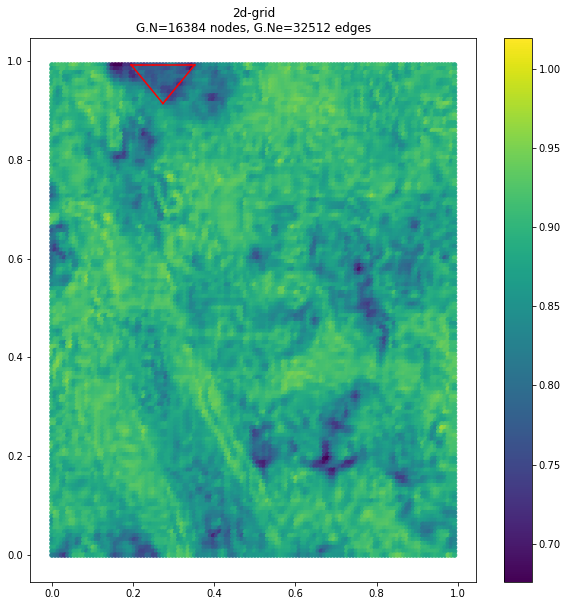

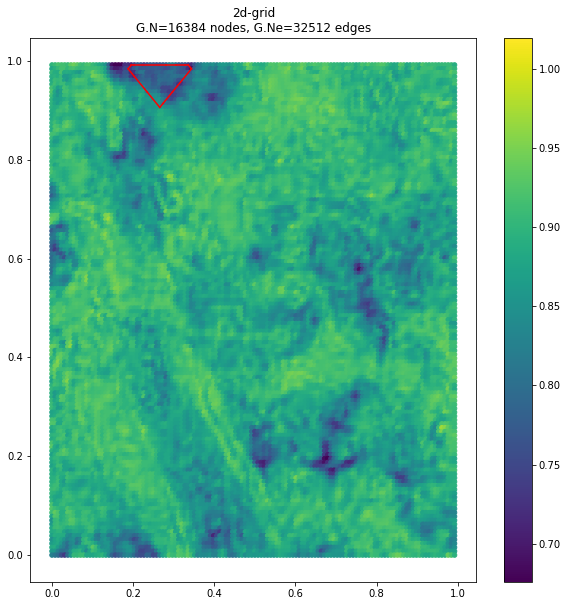

Finish Segmentation
Finish


In [19]:
################## please do experimentation on this #######################

# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from pygsp import graphs

G1 = graphs.Grid2d(128, 128)  # make sure x[0] having dimension nVertices x nChannel
# G1.compute_differential_operator()
# G1.compute_fourier_basis()
# U = tf.convert_to_tensor(G.U, dtype=tf.float32)
G1.plotting['vertex_size'] = 20

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
#ax = plt.figure(figsize=[10, 10])
#G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(object[0])):
    bbox = object[0][i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    ax = plt.figure(figsize=[10, 10])
    G1.plot_signal(img_gray, ax=plt.gca())

    for simplex in hull.simplices:
        plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    print("machin score: {}".format(object[0][i][-1]))
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    #plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [ ]:
######## below is the result on nhop 14 and image 46

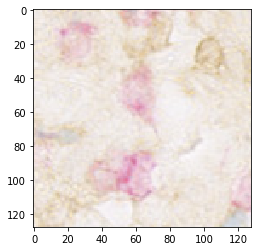

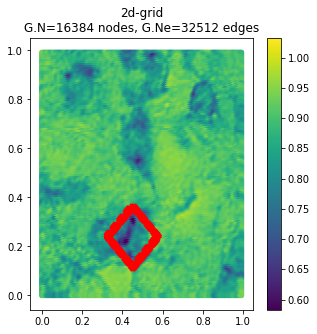

Finish Segmentation
Finish


In [190]:
# with open("mask_rcnn_pred.pkl", "rb") as fp:
#     pred_seg = pickle.load(fp)

sign = np.reshape(pred_sig[0], (128, 128, 3))
sign = sign.astype(np.uint8)
plt.imshow(sign)

img_gray = np.reshape(rgb2gray(sign), [-1])

############## plot the object #############
ax = plt.figure(figsize=[5, 5])
G1.plot_signal(img_gray, ax=plt.gca())

for i in range(0, len(DATA_bbox[0])):
    bbox = DATA_bbox[0][i][2]
    #print(bbox)
    # best_bbox = bbox[-1:]

    # seg_mask = np.reshape(pred_seg.numpy(),[-1])
    # seg_mask_node_blue = np.where(seg_mask == 1)
    # seg_mask_coord_blue = G1.coords[seg_mask_node_blue]

    # seg_mask_node_red = np.where(seg_mask == 2)
    # seg_mask_coord_red = G1.coords[seg_mask_node_red]

    b_coord = np.array(bbox)
    poly_coord = G1.coords[b_coord]
    hull = ConvexHull(poly_coord, qhull_options='QJ')

    #ax = plt.figure(figsize=[5, 5])
    #G1.plot_signal(img_gray, ax=plt.gca())

    #for simplex in hull.simplices:
    #    plt.plot(poly_coord[simplex, 0], poly_coord[simplex, 1], 'r-')
    
    # plt.plot(seg_mask_coord_blue[:,0], seg_mask_coord_blue[:,1], 'ro')
    # plt.plot(seg_mask_coord_red[:,0], seg_mask_coord_red[:,1], 'bo')
    plt.plot(poly_coord[hull.vertices,0], poly_coord[hull.vertices,1], 'r--', lw=2)

plt.show()

print("Finish Segmentation")

print("Finish")

In [45]:
import numpy as np
from sklearn.model_selection import KFold
X = np.array([[1, 2], [3, 4], [1, 2], [3, 4]])
y = np.array([1, 2, 3, 4])
kf = KFold(n_splits=4)
kf.get_n_splits(X)
for train_index, test_index in kf.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

TRAIN: [1 2 3] TEST: [0]
TRAIN: [0 2 3] TEST: [1]
TRAIN: [0 1 3] TEST: [2]
TRAIN: [0 1 2] TEST: [3]


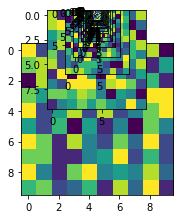

In [153]:
import numpy as np
import matplotlib.pyplot as plt
w=10
h=10
fig=plt.figure()
for i in range(1,20):
    img = np.random.randint(10, size=(h,w))
    fig.add_subplot(i,2,1)
    plt.imshow(img)
plt.show()

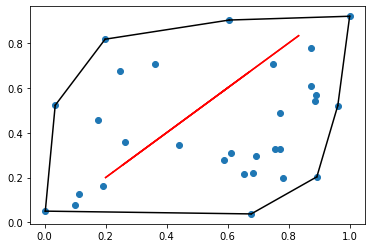

In [166]:
from scipy.spatial import ConvexHull, convex_hull_plot_2d
points_1 = np.random.rand(30, 2)   # 30 random points in 2-D
points_2 = np.random.rand(30, 2)
hull = ConvexHull(points_1)

import matplotlib.pyplot as plt
plt.plot(points_1[:,0], points_1[:,1], 'o')
#plt.plot(points_2[:,0], points_2[:,1], 'r')

for simplex in hull.simplices:
    plt.plot(points_1[simplex, 0], points_1[simplex, 1], 'k-')
    plt.plot(points_2[simplex, 0], points_2[simplex, 0], 'r')


# plt.plot(points[hull.vertices,0], points[hull.vertices,1], 'r--', lw=2)
# plt.plot(points[hull.vertices[0],0], points[hull.vertices[0],1], 'ro')
# plt.show()

In [187]:
plt.plot(points_1[hull.vertices,0], points_1[hull.vertices,1], 'r--', lw=2)
plt.plot(points_1[hull.vertices[0],0], points_1[hull.vertices[0],1], 'ro')
plt.show()

IndexError: index 528 is out of bounds for axis 0 with size 30